# Location Based Recommender System


## 1. Installing dependencies

In [1]:
import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
import missingno as msno
from wordcloud import WordCloud
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm
import gensim
from collections import Counter
import matplotlib.colors as mcolors
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk

## kernel setting
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
sns.set_style('darkgrid')
init_notebook_mode(connected=False)
%matplotlib inline

## Loading the dataset

In [2]:
dataset = pd.read_csv('/kaggle/input/zomato-bangalore-restaurants/zomato.csv')
df = dataset.copy()
print("\nLoading the dataset.")
df.head()


Loading the dataset.


,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


### Basic idea of dataset


Dataset info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list   

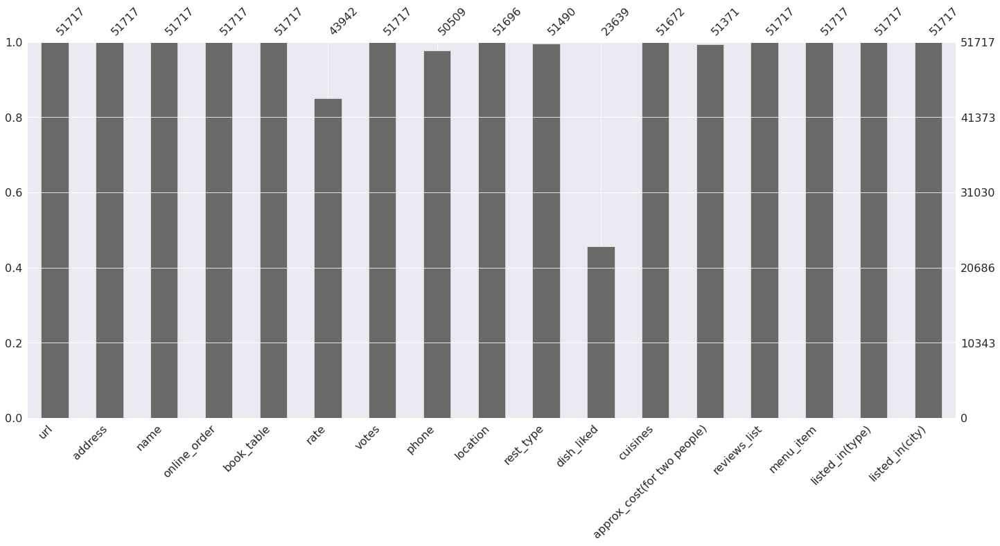

In [3]:
def dataset_info(df):
    print("\nDataset info: ")
    print(df.info())
    print("-"*40)
    print("\nDataset Column Names specifically: ")
    print(df.columns)
    print("-"*40)
    print("\nMissing values: ")
    print(df.isnull().sum())
    print('-'*40)
    print("\n")
    msno.bar(df)
    plt.show()

    
dataset_info(df)

- The above output cell showed us some important insights related to dataframe.

- There are missing values in some columns/variables. 

### Column Description

- **url** conains the url of restaurant in the zomato website
- **address** contains the address of the restaurant in Bengaluru
- **name** contains the name of re
- **online_order** whether online ordering is available in the restaurant or not
- **book_table** table book option available or not
- **rate** contains the overall rating of the restaurant out of 5
- **votes** contains total number of rating for the restaurant as of the above mentioned date
- **phone** contains the phone number of the restaurant
- **location** contains the neighborhood in which the restaurant is located
- **rest_type** restaurant type
- **dish_liked** dishes people liked in the restaurant
- **cuisines** food styles, separated by comma
- **approx_cost(for two people)** contains the approximate cost for meal for two people
- **reviews_list** list of tuples containing reviews for the restaurant, each tuple
- **menu_item** contains list of menus available in the restaurant
- **listed_in(type)** type of meal
- **listed_in(city)** contains the neighborhood in which the restaurant is listed

## 2. Feature Engineering

### EDA - Exploratory Data Analysis

**Is EDA done before or after data cleaning?**

Exploratory Data Analysis (EDA) is the very first step before you can perform any changes to the dataset or develop a statistical model to answer business problems. In other words, the process of EDA contains summarizing, visualizing and getting deeply acquainted with the important traits of a data set.

- **Note**:
Before moving forward in EDA we will fix some columns names, drop duplicates, and casting variables.

In [4]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [5]:
## checking sum of duplicates
df.duplicated().sum()

0

In [6]:
## dropping duplicate values
df.drop_duplicates(inplace=True)

- We'll see the % of the missing values in the dataframe so that and will decide to replace with them with mean/median/mode or simply drop them.

In [7]:
print(round((df.isnull().sum()*100/len(df)),2).sort_values(ascending=False))

dish_liked                     54.29
rate                           15.03
phone                           2.34
approx_cost(for two people)     0.67
rest_type                       0.44
cuisines                        0.09
location                        0.04
listed_in(type)                 0.00
menu_item                       0.00
reviews_list                    0.00
url                             0.00
address                         0.00
votes                           0.00
book_table                      0.00
online_order                    0.00
name                            0.00
listed_in(city)                 0.00
dtype: float64


- We can simply drop the null values as the % of missing values are very less.

In [8]:
# dropping the null value
df.dropna(how='any',inplace=True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23193 entries, 0 to 51715
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          23193 non-null  object
 1   address                      23193 non-null  object
 2   name                         23193 non-null  object
 3   online_order                 23193 non-null  object
 4   book_table                   23193 non-null  object
 5   rate                         23193 non-null  object
 6   votes                        23193 non-null  int64 
 7   phone                        23193 non-null  object
 8   location                     23193 non-null  object
 9   rest_type                    23193 non-null  object
 10  dish_liked                   23193 non-null  object
 11  cuisines                     23193 non-null  object
 12  approx_cost(for two people)  23193 non-null  object
 13  reviews_list                 23

In [10]:
# renaming the columns
df = df.rename(columns={'approx_cost(for two people)':'cost','listed_in(type)':'type','listed_in(city)':'city'})

df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines', 'cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

### 1. Top restaurant in banglore 

In [11]:
df['name'].value_counts(ascending=False)

Onesta               85
Empire Restaurant    69
KFC                  59
McDonald's           57
Pizza Hut            56
                     ..
Agraharam Meal        1
Fresh 'N' Grills      1
Coorg Diaries         1
Lassi Resto Cafe      1
Fujian Express        1
Name: name, Length: 3159, dtype: int64

In [12]:
# top 20 restaurant from Banglore on Zomato
df['name'].value_counts(ascending=False)[:20]

Onesta                    85
Empire Restaurant         69
KFC                       59
McDonald's                57
Pizza Hut                 56
Domino's Pizza            55
Smally's Resto Cafe       54
Faasos                    54
Corner House Ice Cream    52
Burger King               51
Polar Bear                48
Hammered                  47
Smoor                     47
Mani's Dum Biryani        47
Pizza Stop                46
Chung Wah                 45
Mainland China            45
Subway                    45
Lakeview Milkbar          44
Truffles                  43
Name: name, dtype: int64

#### Top 20 restaurants in Banglore by Zomato

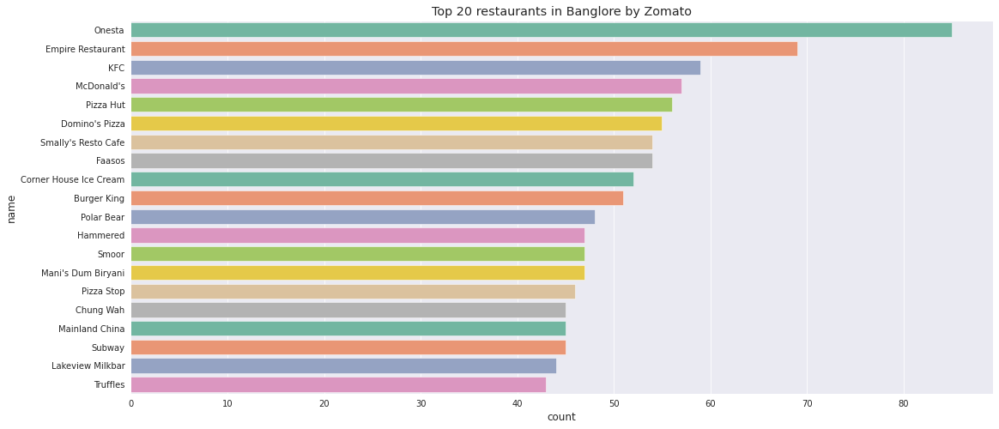

In [13]:
top_20_restaurants = df['name'].value_counts(ascending=False)[:20]

plt.figure(figsize=(18,8))
sns.countplot(y='name', data=df, order=top_20_restaurants.index,palette='Set2')
plt.title("Top 20 restaurants in Banglore by Zomato");

- `Cafe Coffe Day and Onesta` has highest number ordered restaurants in `Banglore, City`.
- Top food chains such as `Baskin Robbins, Pizza Hut, Domino's Piza, KFC, Subway, etc.` are also present.

## How many restaurants accepting online orders?

- As clearly indincated, almost 60 percent of retaurants in Banglore accepts online orders.
- Where 40% of restaurants do not accept online orders.
- This might because of the fact that these restaurants cannot afford to pay commision to Zomato for giving them orders online.

## Ratio between restaurants that provide and do not table booking

In [14]:
print("In normalize form: \n")
df['book_table'].value_counts(normalize=True)

In normalize form: 



No     0.736041
Yes    0.263959
Name: book_table, dtype: float64

- Nearly `90%` of the restaurant in Banglore do not provide table booking facility.
- Although Banglore is one of the major cities in India but sill doesn't provice table booking facilities. One of the reason is that in India table booking facilities are available only in 5-star restaurants.

#### Visualizing the booking table ratio

In [15]:
import plotly.offline as pyo
pyo.init_notebook_mode()

x = df['book_table'].value_counts()
colors = ['#96D38C', '#D0F981']

trace = go.Pie(labels=x.index, values=x, textinfo="value",
              marker=dict(colors=colors,
                         line=dict(color='#000000',width=2)))
layout = go.Layout(title="Table Booking",width=500, height=500)
fig = go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

pyo.plot(fig, filename='book_table.html')

'book_table.html'

- In statistical term we can say that ratio tends more towards `No`

## Rating Distribution

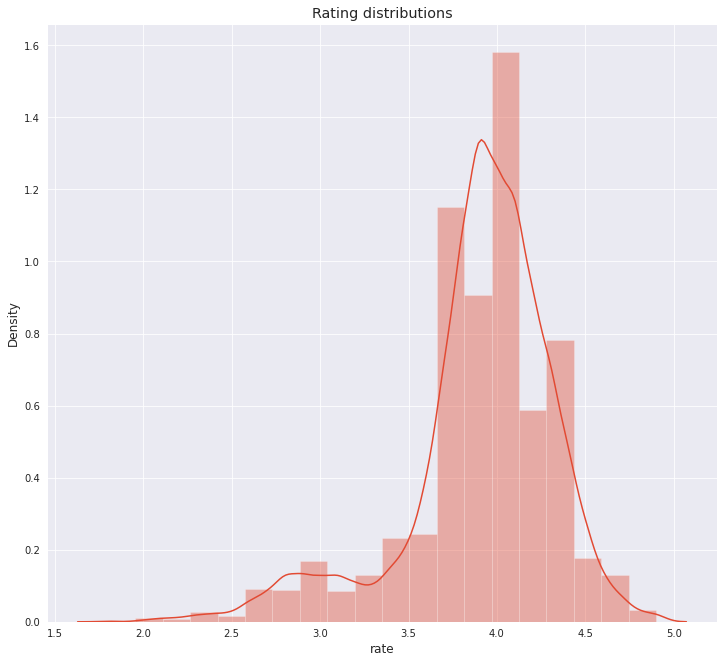

In [16]:
plt.figure(figsize=(12,11))
rating = df['rate'].dropna().apply(lambda x: float(x.split('/')[0]) if (len(x)>3) else np.nan).dropna()
sns.distplot(rating,bins=20)
plt.title('Rating distributions')
plt.show();

- Rating is normally distributed.
- Most of the rating which almost `50%` lies between 3 and 4.

In [17]:
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines', 'cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

## Cost vs Rating

In [18]:
cost_dist=df[['rate','cost','online_order']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['cost']=cost_dist['cost'].apply(lambda x: int(x.replace(',','')))

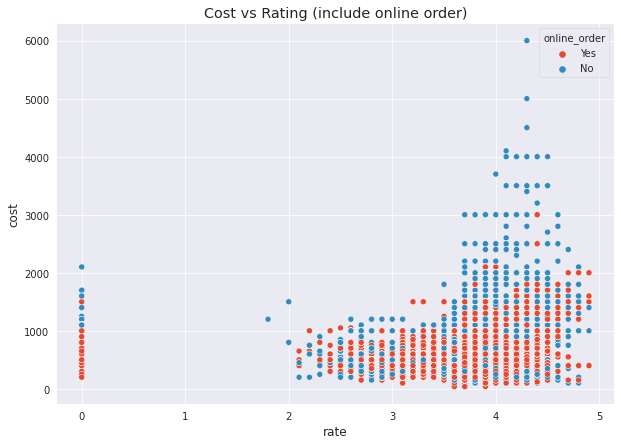

In [19]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='rate', y='cost', hue='online_order',data=cost_dist)
plt.title('Cost vs Rating (include online order)')
plt.show();

- Higher the cost(more than 2500) and rating(more than 3.5) these combination is observed in restaurants which are not supporting online order.
- Most of the restaurants which are supporing online order(Zomato) has cost not more than 2000 and rating ranges from 2.5 to 4.5

## Distribution of cost for two people

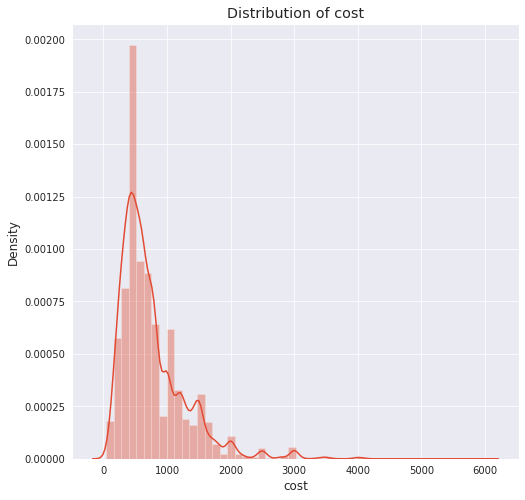

In [20]:
plt.figure(figsize=(8,8))
sns.distplot(cost_dist['cost'])
plt.title('Distribution of cost')
plt.show();

- We can see that the distribution of cost is left skewed.
- This means almost `90%` of the restaurants serve food for budget less that 1000 INR.
- People in a Banglore are rarely spending more than 1000 INR on restaurant foods.

## Is there any difference between votes of restaurants accepting and not accepting online orders?

In [21]:
votes_yes=df[df['online_order']=='Yes']['votes']
trace0=go.Box(y=votes_yes,name='Accepting online orders',
            marker= dict(
            color='rgb(214,12,140)'))
votes_no = df[df['online_order']=='No']['votes']
trace1 = go.Box(y=votes_no, name='Not accepting online orders',
               marker=dict(
               color='rgb(0,128,128)'))
layout = go.Layout(title='Box plots of votes',width=800,height=500)

data = [trace0, trace1]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

- Yes you can observe that median number of votes for both categories vary.
- Restaurants accepting online orders tend to get more votes from customers as there is a rating option poping up after each order through zomato application.

## Top 20 restaurant types in a Bangalore

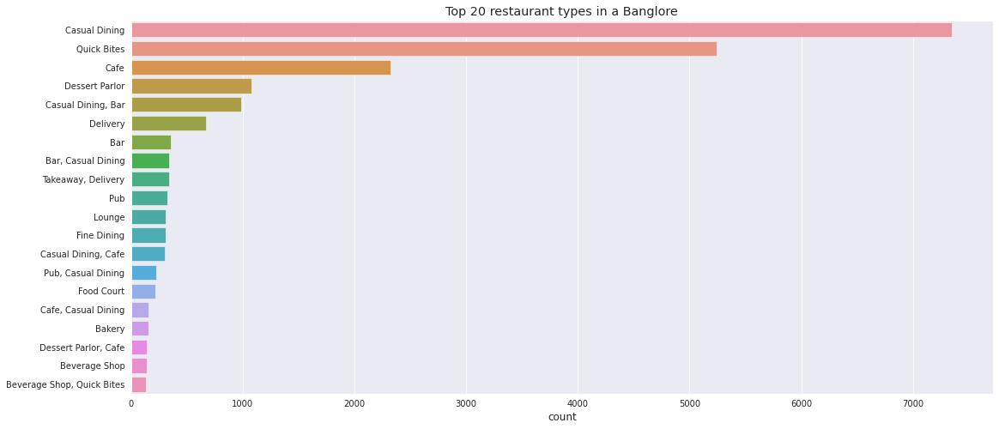

In [22]:
plt.figure(figsize=(18,8))
rest = df['rest_type'].value_counts()[:20]
sns.barplot(rest,rest.index)
plt.title("Top 20 restaurant types in a Banglore")
plt.xlabel("count")
plt.show();

- No doubt about this as Banglore is known as the tech capital of India, people having busy and modern life will prefer Quick Bites.
- We can observe the Quick Bites type restaurants dominates.

## Cost Factor

In [23]:
trace = go.Box(y=df['cost'],name='Accepting online orders',
              marker=dict(
              color='rgb(214, 12, 140)'))
data = [trace0]
layout = go.Layout(title="Box plot of approximate cost", width=800,height=500,yaxis=dict(title="Price"))
fig=go.Figure(data=data, layout=layout)
py.iplot(fig)

- The median approximate cost of two people is 400 for a single meal.
- `50%` of restaurants charge between 300 and 650 for single meal for two people.

## What are some foodies areas in Banglore?

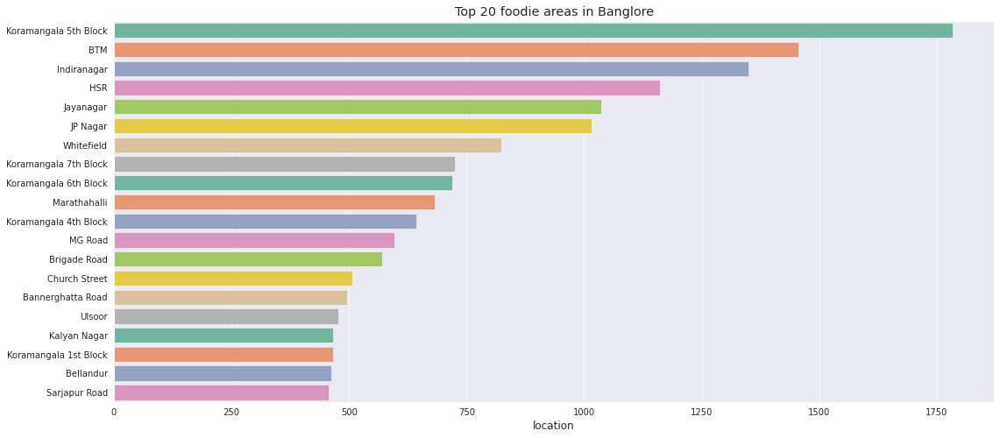

In [24]:
plt.figure(figsize=(18,8))
rest_locations = df['location'].value_counts()[:20]
sns.barplot(rest_locations, rest_locations.index, palette='Set2')
plt.title("Top 20 foodie areas in Banglore")
plt.show();

In [25]:
df['location'].value_counts(ascending=False)[:20]

Koramangala 5th Block    1783
BTM                      1456
Indiranagar              1350
HSR                      1162
Jayanagar                1037
JP Nagar                 1016
Whitefield                824
Koramangala 7th Block     725
Koramangala 6th Block     720
Marathahalli              683
Koramangala 4th Block     644
MG Road                   596
Brigade Road              570
Church Street             508
Bannerghatta Road         496
Ulsoor                    477
Kalyan Nagar              467
Koramangala 1st Block     466
Bellandur                 462
Sarjapur Road             456
Name: location, dtype: int64

- BTM Layout (an abbreviation of Byrasandra, Tavarekere and Madivala Layout) or Kuvempunagara is a locality in Bengaluru, Karnataka, India. By Wikipedia.
- `BTM` is top foodie location in Banglore followed by `Koramangala 5th block` and `HSR`

## Finding best budget Restaurants in any location

- Let's create a function which can find best budget restaurant by passing location name and restaurant types

- Criteria for choosing best restaurant
1. Rating `>=4`
2. Cost `<=500`

In [26]:
cost_dist=df[['rate','cost','location','name','rest_type']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['cost']=cost_dist['cost'].apply(lambda x: int(x.replace(',','')))

The first line of code creates a new dataframe cost_dist by selecting columns 'rate', 'cost', 'location', 'name', and 'rest_type' from the original dataframe df. The dropna method is used to remove any rows with missing values in these columns.

The next two lines of code perform transformations on the 'rate' and 'cost' columns.

The apply method is used to apply a custom function to each element of the 'rate' and 'cost' columns.

For the 'rate' column:

The lambda x function takes in an element 'x' from the column and returns the first item in a list obtained by splitting the string by '/' if the length of the string is greater than 3. If the length is not greater than 3, it returns 0.
For the 'cost' column:

The lambda x function takes in an element 'x' from the column and returns the result of replacing all ',' characters with an empty string and converting the result to an integer.

In [27]:
def return_budget(location, rest):
    budget = cost_dist[(cost_dist['cost']<=500) & (cost_dist['location']==location) & 
                      (cost_dist['rate']>=4) & (cost_dist['rest_type']==rest)]
    return (budget['name'].unique())

In [28]:
return_budget('BTM', 'Quick Bites')

array(['Hiyar Majhe Kolkata', 'Swadista Aahar', 'Swad Punjab Da',
       'Roti Wala', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Nanna Munna Paratha House', 'Andhra Kitchen',
       "Muthashy's", 'Ashirvaad Grand', 'Hungry Lee', 'Kannur Food Point',
       "Domino's Pizza", 'Kesar Sweet Shop and Fast Food', 'KFC',
       'The Biriyani Pedia'], dtype=object)

In [29]:
return_budget('HSR', 'Cafe')

array(['Tea Addict'], dtype=object)

## What are the most common cuisines in each locations?

In [30]:
df_1=df.groupby(['location','cuisines']).agg('count')
data_cuisines_loc=df_1.sort_values(['url'],ascending=False).groupby(['location'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


In [31]:
data_cuisines_loc.head(10)

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",87
1,0,BTM,North Indian,86
2,0,BTM,Cafe,42
3,1,Banashankari,"North Indian, Chinese",30
4,1,Banashankari,South Indian,25
5,1,Banashankari,"South Indian, North Indian, Chinese",17
6,2,Banaswadi,"Cafe, Fast Food",10
7,2,Banaswadi,South Indian,9
8,2,Banaswadi,Biryani,7
9,3,Bannerghatta Road,"North Indian, Chinese",58


- STRANGE! Banglore is located in southern part of India where South Indian food is very famous but our data claims that people ordered `North Indian` food more than South India.
- `Chinese` is another popular cuisine in Banglore


## Extracting location information using Geopy

In [32]:
locations=pd.DataFrame({"Name":df['location'].unique()})
locations['Name']=locations['Name'].apply(lambda x: "Bangalore " + str(x))
lat_lon=[]
geolocator=Nominatim(user_agent="app")
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:    
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)


locations['geo_loc']=lat_lon
locations.to_csv('locations.csv',index=False)

We are creating a new dataframe locations that contains a single column 'Name' which is unique location names from the 'location' column in the original dataframe df.

Then we use the apply method to add the string "Bangalore " to each location name in the 'Name' column.

The Nominatim class from the geopy library is used to perform geocoding on the locations in the 'Name' column. The geocode method is used to get the latitude and longitude for each location.

A list lat_lon is created to store the latitude and longitude values for each location. The geocode method returns a None value if the location is not found, and in this case, a nan value is added to the lat_lon list. If the location is found, its latitude and longitude are obtained and stored as a tuple in the lat_lon list.

Finally, the geo_loc column is added to the locations dataframe to store the latitude and longitude values, and the dataframe is saved to a csv file named 'locations.csv' using the to_csv method.

In [33]:
locations["Name"] = locations['Name'].apply(lambda x: " ".join(filter(lambda y: y!="Bangalore",x.split())))
locations.head()

,Name,geo_loc
0,Banashankari,"(12.965283249999999, 77.59445195)"
1,Basavanagudi,"(12.9417261, 77.5755021)"
2,Jayanagar,"(12.9292731, 77.5824229)"
3,Kumaraswamy Layout,"(12.9081487, 77.5553179)"
4,Rajarajeshwari Nagar,"(12.9274413, 77.5155224)"


## Heatmap of restaurant count on each location

In [34]:
Rest_locations=pd.DataFrame(df['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
Rest_locations['count'].max()

1783

We are creating a new dataframe Rest_locations that contains two columns, 'Name' and 'count'.

The 'Name' column is the unique location names from the 'location' column in the original dataframe df, and the 'count' column is the number of occurrences of each location name.

The value_counts method is used to count the number of occurrences of each location name, and the reset_index method is used to reset the index to a range index. The resulting dataframe is stored in Rest_locations.

The column names of the Rest_locations dataframe are then changed to 'Name' and 'count' using the columns attribute.

The merge method is then used to merge the Rest_locations dataframe with the locations dataframe on the 'Name' column, using a left join (how="left"). The dropna method is used to remove any rows with missing values in the merged dataframe.

Finally, the max method is used to find the maximum value in the 'count' column, which is the number of occurrences of the location with the highest frequency in the 'location' column of the original dataframe.

In [35]:
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [36]:
lat,lon=zip(*np.array(Rest_locations['geo_loc']))
Rest_locations['lat']=lat
Rest_locations['lon']=lon
basemap=generateBaseMap()
HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

We are performing the following operations:

zip(*np.array(Rest_locations['geo_loc'])) - This line of code is using the zip function to unpack the latitude and longitude values from the 'geo_loc' column of the Rest_locations dataframe. The np.array function is used to convert the 'geo_loc' column into a NumPy array, and the * operator is used to unpack the values from the array.

Rest_locations['lat']=lat and Rest_locations['lon']=lon - These lines of code are adding new columns 'lat' and 'lon' to the Rest_locations dataframe to store the latitude and longitude values.

basemap=generateBaseMap() - This line of code is calling a function named 'generateBaseMap' and storing the returned value in a variable named 'basemap'.

HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap) - This line of code is creating a heatmap of the restaurant locations in the Rest_locations dataframe. The HeatMap class is used to create the heatmap, and the required parameters are the latitude, longitude, and count of restaurants at each location. The zoom parameter is set to 20 and the radius parameter is set to 15. The add_to method is then used to add the heatmap to the 'basemap' variable.

In [37]:
basemap

- It is clear thar restaurants tend to concentrate in central Bangalore area.
- So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.

## Which are the most popular cuisines of Bangalore?

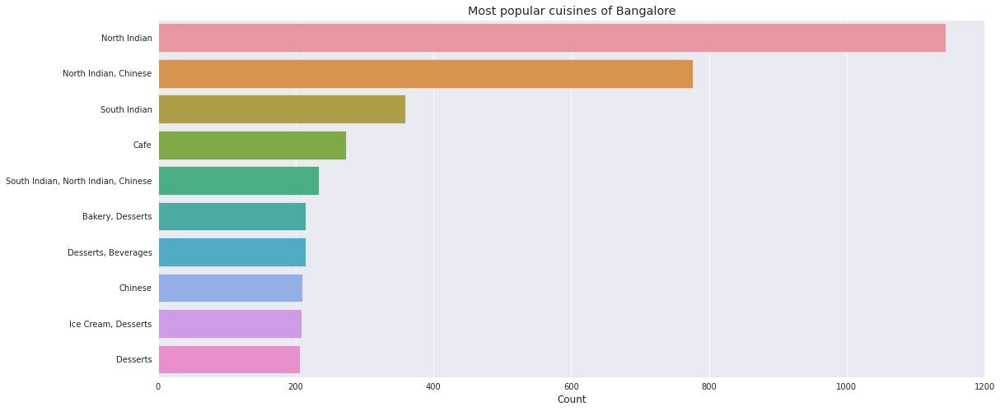

In [38]:
plt.figure(figsize=(18,8))
cuisines=df['cuisines'].value_counts()[:10]
sns.barplot(cuisines,cuisines.index)
plt.xlabel('Count')
plt.title("Most popular cuisines of Bangalore")
plt.show();

- We can observe that `North Indian. Chinese, South Indian and Biryani` are most common.
- Is this implies a fact that Bangalore is more influences by `North Indian` culture more than South?
- We will inspect furhter...

## Hotspot of North Indian restaurants

In [39]:
def produce_data(col,name):
    data= pd.DataFrame(df[df[col]==name].groupby(['location'],as_index=False)['url'].agg('count'))
    data.columns=['Name','count']
    print(data.head())
    data=data.merge(locations,on="Name",how='left').dropna()
    data['lan'],data['lon']=zip(*data['geo_loc'].values)
    return data.drop(['geo_loc'],axis=1)

In [40]:
North_India=produce_data('cuisines','North Indian')

                Name  count
0                BTM     86
1       Banashankari     10
2          Banaswadi      4
3  Bannerghatta Road     36
4       Basavanagudi     12


In [41]:
basemap=generateBaseMap()
HeatMap(North_India[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

- So it is interesting to see cluster of North Indian restaurants in South Banglore Area.


## South Indian restaurants

In [42]:
food = produce_data('cuisines','South Indian')
basemap = generateBaseMap()
HeatMap(food[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

                Name  count
0                BTM      6
1       Banashankari     25
2          Banaswadi      9
3  Bannerghatta Road      3
4       Basavanagudi     44


- They tend to span all over Bangalore
- South Indian cuisines tend to cluster near central Bangalore.

## Analysing Restaurant Chains

Defines a function called produce_chains which takes a single argument name.

Inside the function, it creates a new pandas DataFrame called data_chain by selecting rows from an existing DataFrame df where the "name" column matches the input name. It then calculates the count of each unique "location" value in the "locatin" column of this filtered DataFrame and stores the result in a new "Count" column.

The code then renames the columns of data_chain to "Name" and "Count", merges it with a separate DataFrame called locations on the "Name" column, drops any rows with missing values, and extracts the "geo_loc" column.

Finally, it splits the "geo_loc" column into separate "lan" and "lon" columns and returns a new DataFrame with columns "Name", "Count", "lan", and "lon".

Overall, this function processes data related to location and producing a DataFrame that shows the counts of different locations for a given name along with their latitude and longitude coordinates.

In [43]:
def produce_chains(name):
    data_chain = pd.DataFrame(df[df["name"]==name]['locatin'].value_counts().reset_index())
    data_chains.columns = ['Name','Count']
    data_chain=data_chain.merge(locations, on="Name", how="left").dropna()
    data_chain['lan'],data_chain['lon']=zip(*data_chain['geo_loc'].values)
    return data_chain[['Name','Count', 'lan','lon']]

In [44]:
df_1=df.groupby(['rest_type','name']).agg('count')
datas=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


## Which are most popular casual dining restaurant?

In [45]:
casual=datas[datas['rest_type']=='Casual Dining']
casual

,level_0,rest_type,name,count
49,20,Casual Dining,Empire Restaurant,58
50,20,Casual Dining,Mani's Dum Biryani,47
51,20,Casual Dining,Chung Wah,45


- We can see that `Empire Restaurant, Mani's Dum Biryani, and Chung Wah` are the most popular casual dining restauant chains in Bangalore.


## Analysing Reviews

- In this section we will go no to prepare review dataframe.
- We will extract reviews and ratings of each restaurant and create a dataframe with it.

In [46]:
all_ratings = []
for name, ratings in tqdm(zip(df['name'],df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name, score, doc])

23193it [00:14, 1628.27it/s]


In [47]:
rating_df=pd.DataFrame(all_ratings,columns=['name','rating','review'])
rating_df['review']=rating_df['review'].apply(lambda x : re.sub('[^a-zA-Z0-9\s]',"",x))

In [48]:
rating_df.to_csv('Ratings.csv')

In [49]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


## WordCloud of reviews of restaurants chains

produce_wordcloud which takes a list of restaurant names as input (rest) and generates a word cloud for each restaurant's reviews. The function first creates a figure with 9 subplots, each containing a word cloud for a restaurant. It then loops over each restaurant in the input list, selects the reviews for that restaurant from a dataframe called rating_df, and concatenates them into a single string. The WordCloud module is then used to generate a word cloud from the concatenated string, which is displayed in the corresponding subplot along with the restaurant name as the title. Finally, the axis for each subplot is turned off to remove unnecessary clutter.

The dataframe rating_df with columns 'name' and 'review' contains review data for various restaurants. Additionally, the code only generates word clouds for the top 9 most frequently reviewed restaurants, as determined by the value counts of the 'name' column in the df dataframe.

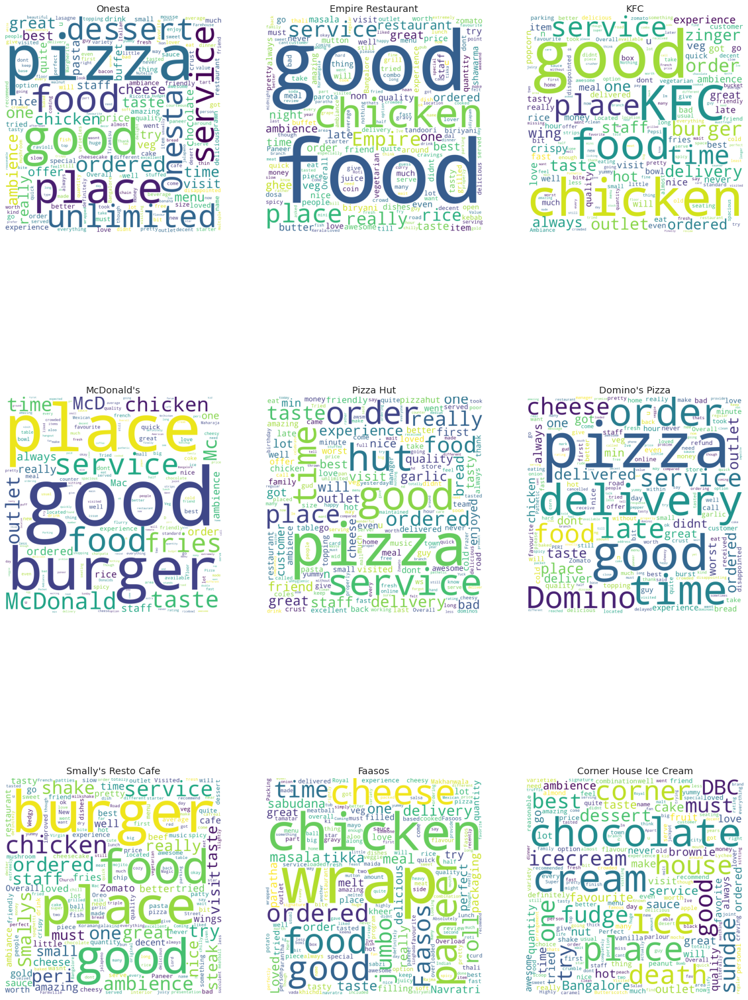

In [50]:
rest=df['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus=' '.join(x  for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

## Rating distribution

Text(0, 0.5, 'Count')

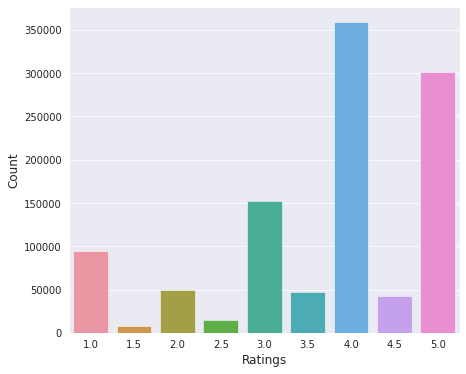

In [51]:
plt.figure(figsize=(7,6))
rating=rating_df['rating'].value_counts()
sns.barplot(x=rating.index, y=rating)
plt.xlabel('Ratings')
plt.ylabel('Count')

# Data Transformation

In [52]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [53]:
df['cost'] = df['cost'].astype(str)
df['cost'] = df['cost'].apply(lambda x: x.replace(',','.'))
df['cost'] = df['cost'].astype(float)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23193 entries, 0 to 51715
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   url           23193 non-null  object 
 1   address       23193 non-null  object 
 2   name          23193 non-null  object 
 3   online_order  23193 non-null  object 
 4   book_table    23193 non-null  object 
 5   rate          23193 non-null  object 
 6   votes         23193 non-null  int64  
 7   phone         23193 non-null  object 
 8   location      23193 non-null  object 
 9   rest_type     23193 non-null  object 
 10  dish_liked    23193 non-null  object 
 11  cuisines      23193 non-null  object 
 12  cost          23193 non-null  float64
 13  reviews_list  23193 non-null  object 
 14  menu_item     23193 non-null  object 
 15  type          23193 non-null  object 
 16  city          23193 non-null  object 
dtypes: float64(1), int64(1), object(15)
memory usage: 3.7+ MB


In [54]:
# rate of dataset
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '4.6/5', '4.0/5', '4.2/5', '3.9/5',
       '3.0/5', '3.6/5', '2.8/5', '4.4/5', '3.1/5', '4.3/5', '2.6/5',
       '3.3/5', '3.5/5', '3.8 /5', '3.2/5', '4.5/5', '2.5/5', '2.9/5',
       '3.4/5', '2.7/5', '4.7/5', 'NEW', '2.4/5', '2.2/5', '2.3/5',
       '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5', '4.1 /5', '2.9 /5',
       '2.7 /5', '2.5 /5', '2.6 /5', '4.5 /5', '4.3 /5', '3.7 /5',
       '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '3.4 /5', '3.6 /5',
       '3.3 /5', '4.6 /5', '4.9 /5', '3.2 /5', '3.0 /5', '2.8 /5',
       '3.5 /5', '3.1 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [55]:
# remove '/5' from rates
df = df.loc[df.rate!='NEW']
df = df.loc[df.rate!='-'].reset_index(drop=True)
remove_slash = lambda x: x.replace('/5', '') if type(x) == np.str else x
df.rate = df.rate.apply(remove_slash).str.strip().astype('float')
df['rate'].head()

0    4.1
1    4.1
2    3.8
3    3.7
4    3.8
Name: rate, dtype: float64

In [56]:
# Adjust the column names
df.name = df.name.apply(lambda x:x.title())
df.online_order.replace(('Yes', 'No'),(True, False),inplace=True)
df.book_table.replace(('Yes', 'No'),(True, False),inplace=True)
df.cost.unique()

array([800.  , 300.  , 600.  , 700.  , 550.  , 500.  , 450.  , 650.  ,
       400.  , 750.  , 200.  , 850.  ,   1.2 , 150.  , 350.  , 250.  ,
         1.5 ,   1.3 ,   1.  , 100.  , 900.  ,   1.1 ,   1.6 , 950.  ,
       230.  ,   1.7 ,   1.35,   2.2 ,   1.4 ,   2.  ,   1.8 ,   1.9 ,
       180.  , 330.  ,   2.5 ,   2.1 ,   3.  ,   2.8 ,   3.4 ,  40.  ,
         1.25,   3.5 ,   4.  ,   2.4 ,   1.45,   3.2 ,   6.  ,   1.05,
         4.1 ,   2.3 , 120.  ,   2.6 ,   5.  ,   3.7 ,   1.65,   2.7 ,
         4.5 ])

In [57]:
## checking null values again
df.isnull().sum()

url             0
address         0
name            0
online_order    0
book_table      0
rate            0
votes           0
phone           0
location        0
rest_type       0
dish_liked      0
cuisines        0
cost            0
reviews_list    0
menu_item       0
type            0
city            0
dtype: int64

In [58]:
## Computing Mean rating
restaurants = list(df['name'].unique())
df['Mean Rating'] = 0

for i in range(len(restaurants)):
    df['Mean Rating'][df['name']==restaurants[i]] = df['rate'][df['name']==restaurants[i]].mean()

In [59]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,Mean Rating
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,True,True,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,4.118182
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,True,False,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,4.100000
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,True,False,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,3.800000
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,False,False,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,3.700000
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,False,False,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,3.800000


## Scaling the data 

In [60]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(1,5))
df[['Mean Rating']] = scaler.fit_transform(df[['Mean Rating']]).round(2)

df.sample(3)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,Mean Rating
16697,https://www.zomato.com/bangalore/tiger-trail-r...,"Ramada Hotel, 11, Park Road, Shivajinagar, Ban...",Tiger Trail - Ramada Hotel,True,True,4.0,188,+91 8022865566\n+91 9902000018,Shivajinagar,"Casual Dining, Bar","Biryani, Custard, Paratha, Poha, Breakfast Buf...","North Indian, Lucknowi",1.3,"[('Rated 1.0', 'RATED\n Is this place really ...","['Sarson Ka Saag', 'Tiger Trail Butter Chicken...",Buffet,Lavelle Road,3.84
19782,https://www.zomato.com/bangalore/stoned-monkey...,"71, KGEHB Layout, Aramane Nagar, Devasandra, N...",Stoned Monkey,True,False,4.0,255,+91 9972710694,New BEL Road,Dessert Parlor,"Nachos, Chocolava, Sandwiches, Waffles, Browni...","Desserts, Ice Cream",500.0,"[('Rated 1.0', 'RATED\n The ice cream was goo...","['Mr. Rocher', 'Red Romance', 'Lavalicious', '...",Delivery,New BEL Road,3.94
18075,https://www.zomato.com/bangalore/the-mint-rest...,"38/3, Opposite EMC 2, Doddanekkundi ORR, Marat...",The Mint Resto Bar,False,True,2.6,62,+91 7259688882,Marathahalli,"Casual Dining, Bar",Prompt Service,"North Indian, Chinese, Andhra",1.0,"[('Rated 1.0', ""RATED\n Not satisfied with ev...",[],Buffet,Marathahalli,2.03


## Text Preprocessing

- Converting text into lower case
- Removal of punctuations, stopwords, and URL
- Spelling correction

In [61]:
df[['reviews_list','cuisines']].sample(5)

,reviews_list,cuisines
8447,"[('Rated 4.0', ""RATED\n Was there last Saturd...","Finger Food, Continental, Chinese"
21255,"[('Rated 4.0', 'RATED\n Went with my family a...","Chinese, Continental, North Indian, Mughlai, S..."
20930,"[('Rated 5.0', 'RATED\n Navrang kabab korner ...","North Indian, Mughlai, Biryani, Chinese, Kebab"
12159,"[('Rated 5.0', 'RATED\n VFM 5/5\nTaste 5/5\nT...","Street Food, Fast Food"
20204,"[('Rated 1.0', 'RATED\n Poor Packing. Food wa...","Biryani, Chinese"


In [62]:
## lower casing 
df['reviews_list'] = df['reviews_list'].str.lower()
df[['reviews_list', 'cuisines']].sample(5)

,reviews_list,cuisines
20446,"[('rated 4.0', 'rated\n heard a lot about thi...","Andhra, North Indian"
2337,"[('rated 1.0', 'rated\n the place that has lo...","South Indian, North Indian, Chinese"
13016,"[('rated 5.0', 'rated\n they say it right yum...","Cafe, Salad"
12039,"[('rated 4.0', ""rated\n wondering why i did n...","Kerala, Seafood, South Indian, North Indian, C..."
4963,"[('rated 4.0', 'rated\n love this place. beer...","Finger Food, Chinese, Continental"


In [63]:
# Removal of punctuations
import string
punc_to_remove = string.punctuation
def remove_punctuation(text):
    """custom function to remove the punctuation"""
    return text.translate(str.maketrans('','',punc_to_remove))

df['reviews_list'] = df['reviews_list'].apply(lambda text: remove_punctuation(text))
df[['reviews_list','cuisines']].sample(5)

,reviews_list,cuisines
1690,rated 10 ratedn the chicken used in their chi...,"North Indian, Mughlai, Biryani, Rolls"
18222,rated 30 ratedn a decent place to have snack ...,"Cafe, Beverages"
2330,rated 30 ratedn on one hand loved the petfrie...,"Cafe, American, Italian, Burger"
17818,rated 20 ratedn friday night dinnernambience ...,North Indian
5228,rated 30 ratedn biryani was really nice and d...,"Biryani, North Indian, Chinese"


In [64]:
## Removal of stopwords
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    """custom function to remove the stopwords"""
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

df['reviews_list'] = df['reviews_list'].apply(lambda text: remove_stopwords(text))

In [65]:
## Remove of URLs
def remove_urls(text):
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    return url_pattern.sub(r'',text)

df['reviews_list'] = df['reviews_list'].apply(lambda text: remove_urls(text))

In [66]:
df[['reviews_list','cuisines']].sample(5)

,reviews_list,cuisines
17409,rated 30 ratedn offer variety momos including ...,"Tibetan, Momos"
18506,rated 50 ratedn tried hashtag kitchen open clo...,"North Indian, Biryani, Chinese"
7210,rated 50 ratedn eaten lg many times never fail...,"Turkish, Arabian, Fast Food, Desserts, Healthy..."
9132,rated 30 ratedn assignment listening place lot...,"North Indian, Italian"
7397,rated 30 ratedn went team lunch menu wide vari...,"Andhra, Chinese, North Indian, Hyderabadi"


## Text Vectorization

In [67]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
def get_top_words(column, top_nu_of_words, nu_of_word):
    vec = CountVectorizer(ngram_range=nu_of_word, stop_words='english')
    bow = vec.fit_transform(column)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0,idx]) for word, idx in vec.vocabulary.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:top_nu_of_words]

In [68]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,Mean Rating
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,True,True,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,rated 40 ratedn beautiful place dine inthe int...,[],Buffet,Banashankari,3.99
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,True,False,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,rated 40 ratedn dinner family turned good choo...,[],Buffet,Banashankari,3.97
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,True,False,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,rated 30 ratedn ambience good enough pocket fr...,[],Buffet,Banashankari,3.58
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,False,False,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,rated 40 ratedn great food proper karnataka st...,[],Buffet,Banashankari,3.45
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,False,False,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,rated 40 ratedn good restaurant neighbourhood ...,[],Buffet,Banashankari,3.58


In [69]:
df.shape

(23046, 18)

In [70]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,Mean Rating
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,True,True,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,rated 40 ratedn beautiful place dine inthe int...,[],Buffet,Banashankari,3.99
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,True,False,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,rated 40 ratedn dinner family turned good choo...,[],Buffet,Banashankari,3.97
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,True,False,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,rated 30 ratedn ambience good enough pocket fr...,[],Buffet,Banashankari,3.58
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,False,False,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,rated 40 ratedn great food proper karnataka st...,[],Buffet,Banashankari,3.45
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,False,False,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,rated 40 ratedn good restaurant neighbourhood ...,[],Buffet,Banashankari,3.58


In [71]:
df.shape

(23046, 18)

## Building Recommendation System Engine

In [72]:
# Randomly sample 60% of your dataframe
df_percent = df.sample(frac=0.5)

In [73]:
df_percent.shape

(11523, 18)

#### TF-IDF Vectorization

In [74]:
df_percent.set_index('name', inplace=True)

In [75]:
indices = pd.Series(df_percent.index)

In [76]:
indices

0                           Vyanjan
1                          Chaiwala
2                     Coconut Grove
3                 Sreeraj Lassi Bar
4                           Laddoos
                    ...            
11518       Bombay Sandwich Company
11519               Szechuan Dragon
11520         Davanagere Benne Dose
11521              Eshmeet Da Dhaba
11522    Third Wave Coffee Roasters
Name: name, Length: 11523, dtype: object

In [77]:
## Create TF-IDF matrix
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(analyzer='word', ngram_range=(1,2), min_df=0, stop_words='english')
tfidf_matrix = tfidf.fit_transform(df_percent['reviews_list'])

Cosine similarity is a measure of similarity between two non-zero vectors of an inner product space that measures the cosine of the angle between them. In other words, it is a measure of the angle between two vectors in a space, with a value between -1 and 1. The cosine similarity between two vectors is equal to the dot product of the vectors divided by the product of their magnitudes.

In [78]:
from sklearn.metrics.pairwise import linear_kernel
cosine_similarity = linear_kernel(tfidf_matrix, tfidf_matrix)

In [79]:
## recommendation system

def recommend(name, cosine_similarities=cosine_similarity):
    # create a list to put top restaurants
    recommend_restaurant = []
    
    # find the index of the hotel entered
    idx = indices[indices==name].index[0]
    
    # find the restaurants with a similar cosine-sim value and order them from bigger number
    score_series = pd.Series(cosine_similarities[idx]).sort_values(ascending=False)
    
    # Extract top 30 restaurant indexes with a similar cosine-sim value
    top30_indexes = list(score_series.iloc[0:31].index)
    
    # Name of top 30 restaurants
    for each in top30_indexes:
        recommend_restaurant.append(list(df_percent.index)[each])
        
    # Creating the new data set to show similar restaurants
    df_new = pd.DataFrame(columns=['cuisines','Mean Rating','cost'])
    
    
    # Create the top 30 similar restaurants with some of their columns
    for each in recommend_restaurant:
        df_new = df_new.append(pd.DataFrame(df_percent[['cuisines','Mean Rating', 'cost']][df_percent.index==each].sample()))  
    
    # Drop the same named restaurants and sort only the top 10 by the highest rating
    df_new = df_new.drop_duplicates(subset=['cuisines','Mean Rating','cost'],keep=False)
    df_new = df_new.sort_values(by='Mean Rating',ascending=False).head(10)
    print('TOP %s RESTAURANTS LIKE %s WITH SIMILAR REVIEWS: ' %(str(len(df_new)),name))
    
    return df_new

In [80]:
# HERE IS A RANDOM RESTAURANT. LET'S SEE THE DETAILS ABOUT THIS RESTAURANT
df_percent[df_percent.index=='Pai Vihar'].head()

,url,address,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,Mean Rating
name,,,,,,,,,,,,,,,,,
Pai Vihar,https://www.zomato.com/bangalore/pai-vihar-vas...,"16/A, Ground Floor, Kkmp Building, Vasanth Nag...",True,False,2.8,56,+91 8041235143,Vasanth Nagar,Quick Bites,"Masala Dosa, Coffee","South Indian, Street Food, Chinese, Fast Food",400.0,rated 30 ratedn 12 rate herenneven though tast...,"['Uddina Vada', 'Open Butter Masala Dosa', 'Ma...",Delivery,Frazer Town,2.48
Pai Vihar,https://www.zomato.com/bangalore/pai-vihar-vas...,"16/A, Ground Floor, Kkmp Building, Vasanth Nag...",True,False,2.8,55,+91 8041235143,Vasanth Nagar,Quick Bites,"Masala Dosa, Coffee","South Indian, Street Food, Chinese, Fast Food",400.0,rated 30 ratedn 12 rate hereãx83ãx83ãx82ãx...,[],Delivery,MG Road,2.48
Pai Vihar,https://www.zomato.com/bangalore/pai-vihar-vas...,"16/A, Ground Floor, Kkmp Building, Vasanth Nag...",False,False,2.8,56,+91 8041235143,Vasanth Nagar,Quick Bites,"Masala Dosa, Coffee","South Indian, Street Food, Chinese, Fast Food",400.0,rated 30 ratedn 12 rate hereãx83ãx83ãx82ãx...,[],Delivery,Residency Road,2.48
Pai Vihar,https://www.zomato.com/bangalore/pai-vihar-vas...,"16/A, Ground Floor, Kkmp Building, Vasanth Nag...",True,False,2.8,56,+91 8041235143,Vasanth Nagar,Quick Bites,"Masala Dosa, Coffee","South Indian, Street Food, Chinese, Fast Food",400.0,rated 30 ratedn 12 rate herenneven though tast...,[],Dine-out,Frazer Town,2.48
Pai Vihar,https://www.zomato.com/bangalore/pai-vihar-cit...,"1106, OTC Road, Opposite City Corporation Offi...",False,False,3.3,42,+91 9611089099\n+91 9036049466,City Market,Quick Bites,Vada,"South Indian, Street Food, Chinese, Fast Food",400.0,rated 20 ratedn food dry bland dont understand...,[],Dine-out,Lavelle Road,2.48


In [81]:
recommend('Pai Vihar')

TOP 7 RESTAURANTS LIKE Pai Vihar WITH SIMILAR REVIEWS: 


,cuisines,Mean Rating,cost
Shanthi Sagar,"South Indian, North Indian, Chinese",3.72,400.0
Upahar Sagar,"South Indian, Chinese, North Indian",3.58,350.0
Prasiddhi Food Corner,"Fast Food, North Indian, South Indian",3.45,200.0
Cafe Mondo,"Cafe, Italian, Pizza, Chinese",3.39,700.0
Mayura Sagar,"Chinese, North Indian, South Indian",3.32,250.0
The Diner,"North Indian, Chinese, Andhra, Biryani",3.32,700.0
Marwa Restaurant,"North Indian, Chinese, Fast Food, BBQ",3.19,600.0
